In [1]:
import os

from rembg import remove

import matplotlib.pyplot as plt

import cv2

import numpy as np

In [2]:
# we define a helper function to print the image using `matplotlib`

# this prints colored image
def print_image(img, isGray=False, title="Image"):
    # OpenCV reads images in BGR, and matplotlib reads images in RGB
    # so, we switch the color channels using `cvtColor` method
    
    # if isGray = True, we first grayscale the image using the same `cvtColor` method
    if isGray:
        img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        img_colored = cv2.cvtColor(img_gray, cv2.COLOR_BGR2RGB)
    else:
        img_colored = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    plt.figure(figsize=(10,6))
    plt.imshow(img_colored)
    plt.axis(False)
    plt.title(title)
    plt.show()


In [3]:
# define helper fucntion to extract pathname of images in a folder

def extract_path(dir_path):
    # Create a list to store the file paths
    file_paths = []

    # Loop through all files in the directory
    for filename in os.listdir(dir_path):
        # Check if the file is an image file (e.g. .jpg, .jpeg, .png, .jfif etc.)
        if filename.endswith(".jpg") or filename.endswith(".jpeg") or filename.endswith(".png") or filename.endswith(".jfif"):
            # Add the full file path to the list
            file_paths.append(os.path.join(dir_path, filename))
    
    return file_paths

In [4]:
# laser cut images path
laser_cut_folder_path = os.path.join('data', 'cad_data', 'laser_parts')
img_paths = extract_path(laser_cut_folder_path)
len(img_paths)

22

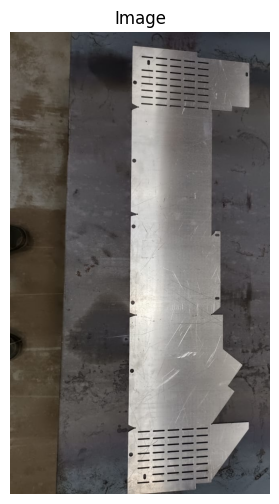

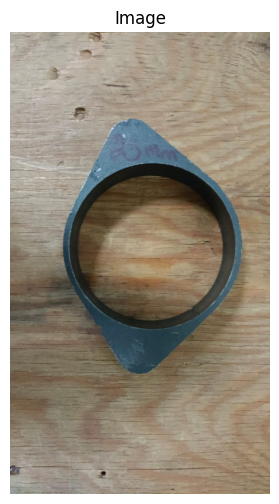

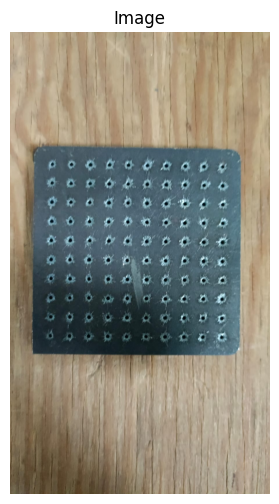

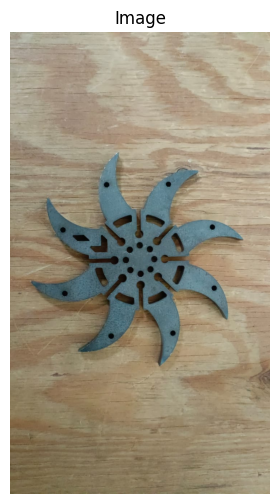

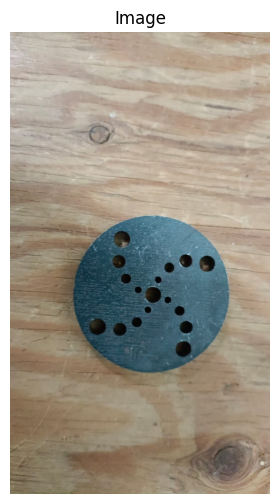

...

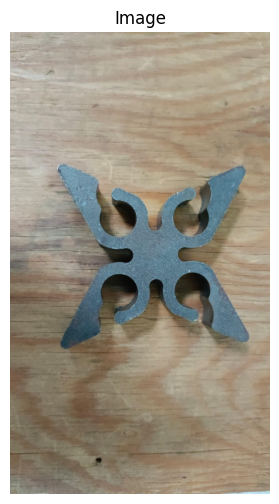

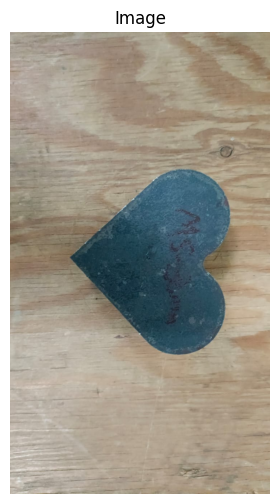

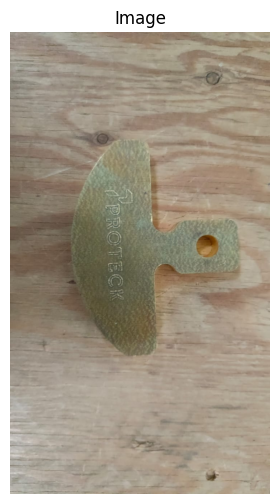

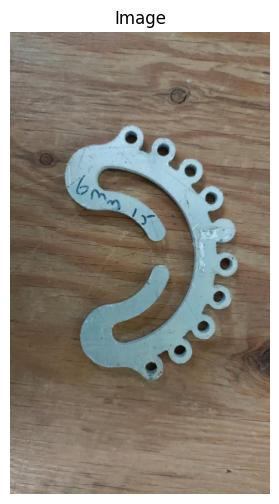

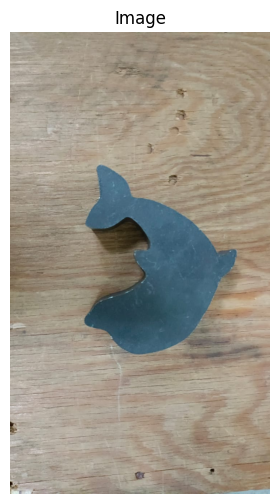

In [5]:
for img_path in img_paths:
    img = cv2.imread(img_path)
    print_image(img)

In [6]:
bgrem_output_path = os.path.join('data', 'cad_data', 'laser_parts_bgrem')

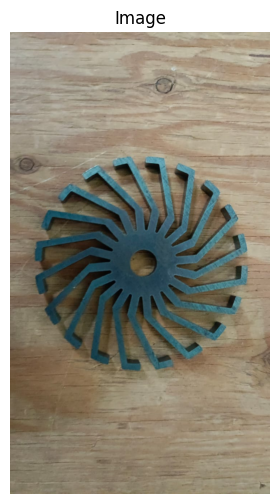

In [60]:
img_path = 'data/cad_data/laser_parts/laser_part14.jfif'
img_test = cv2.imread('data/cad_data/laser_parts/laser_part14.jfif')
print_image(img_test)
h,w,c = img_test.shape

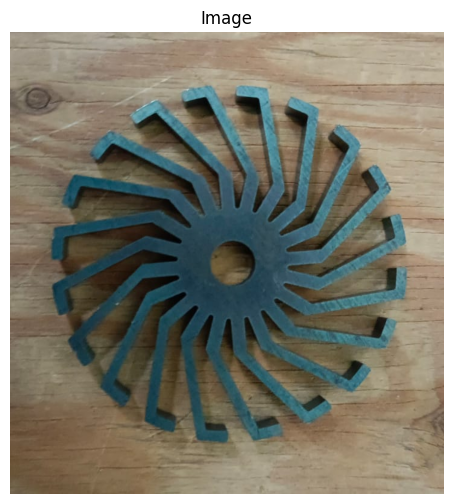

In [61]:
img_test_cropped = img_test[h//5:4*h//5, :, :]
print_image(img_test_cropped)

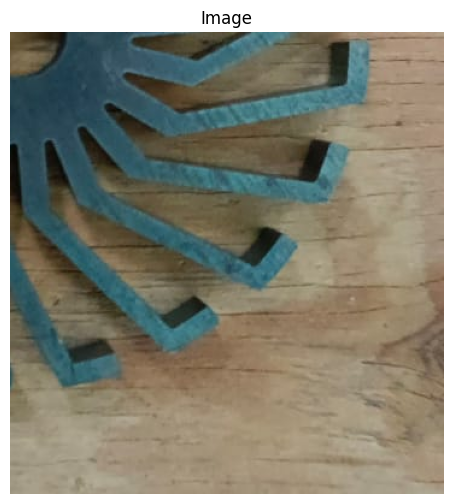

In [63]:
hc, wc, c = img_test_cropped.shape
img_test_cropped2 = img_test_cropped[hc//2:, wc//2:, :]
print_image(img_test_cropped2)

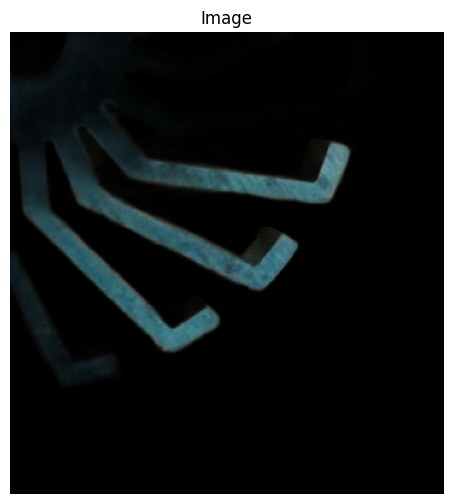

In [64]:
breg_img = remove(img_test_cropped2)
print_image(breg_img)

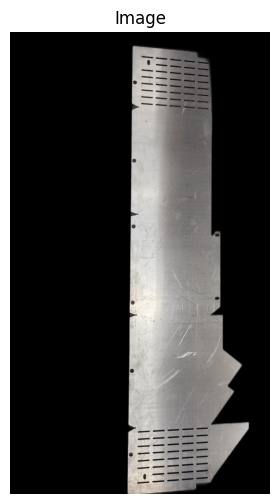

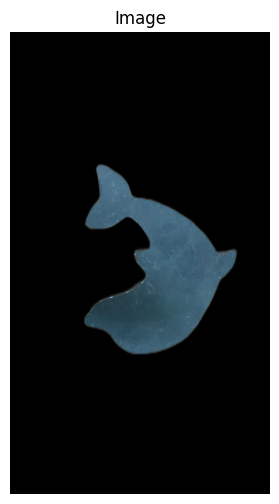

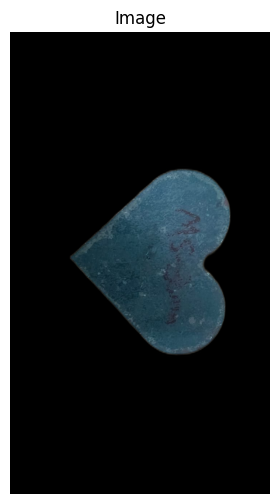

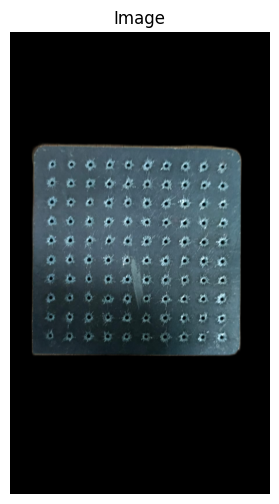

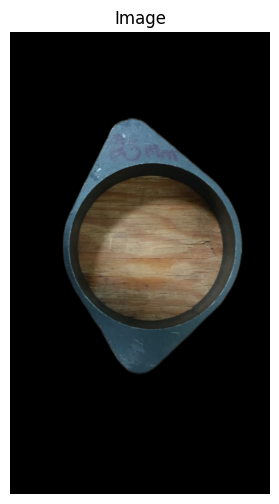

...

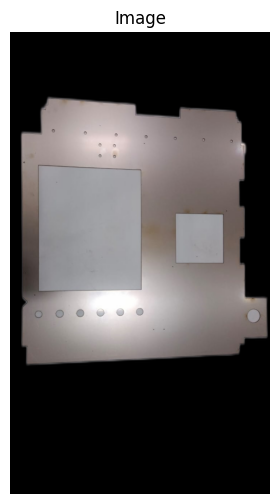

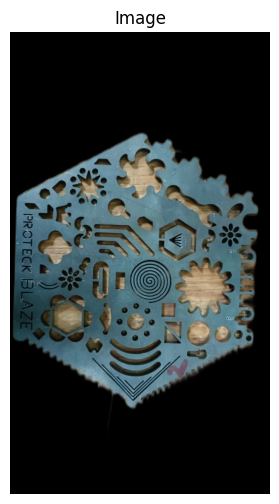

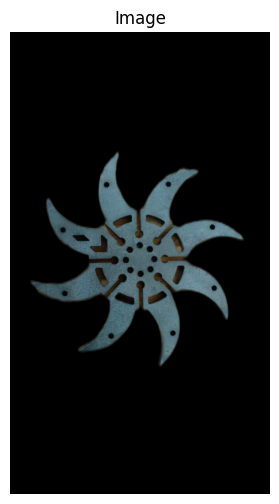

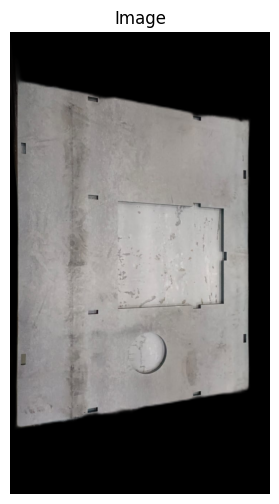

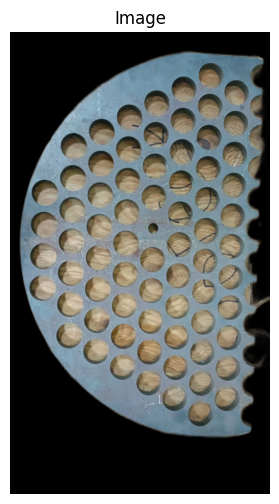

In [56]:
for img_path in img_paths:
    img = cv2.imread(img_path)
    bgrem_img = remove(img)
    img_name = img_path.split('/')[-1]
    bgrem_img_path = os.path.join(bgrem_output_path, img_name+'.png')
    cv2.imwrite(bgrem_img_path, bgrem_img)
    print_image(bgrem_img)

In [5]:
# laser cut images path
laser_cut_bgrem_folder_path = os.path.join('data', 'cad_data', 'laser_parts_bgrem')
bgrem_img_paths = extract_path(laser_cut_bgrem_folder_path)
len(bgrem_img_paths)

22

In [4]:
bgrem_noiserem_output_path = os.path.join('data', 'cad_data', 'laser_parts_bgrem_noiserem')

In [6]:
for img_path in bgrem_img_paths:
    img = cv2.imread(img_path)
    bgrem_noiserem_img = remove(img)
    img_denoised = cv2.fastNlMeansDenoisingColored(bgrem_noiserem_img, None, h=5, searchWindowSize = 21)
    img_name = img_path.split('/')[-1]
    bgrem_noiserem_img_path = os.path.join(bgrem_noiserem_output_path, img_name+'.png')
    cv2.imwrite(bgrem_noiserem_img_path, img_denoised)
    #print_image(bgrem_noiserem_img)

In [8]:
# laser cut images path
laser_cut_bgrem_folder_path = os.path.join('data', 'cad_data', 'laser_parts_bgrem')
bgrem_img_paths = extract_path(laser_cut_bgrem_folder_path)
len(bgrem_img_paths)

22

In [65]:
def edge_detect(img_path):
    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    gray = cv2.GaussianBlur(gray, (3, 3), 0)
    edges = cv2.Canny(gray, 50, 150)
    return edges

In [35]:
def edge_detect_threshold(img_path, threshold=300):
    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    gblur = cv2.GaussianBlur(gray, (3, 3), 0)
    nongblur_edges = cv2.Canny(gray, 50, 150)
    gblur_edges = cv2.Canny(gblur, 50, 100)
    sum_edges = nongblur_edges + gblur_edges
    blank = np.zeros(img.shape, dtype=np.uint8)
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            if sum_edges[i,j] >= threshold:
                blank[i,j] = 255
            else:
                blank[i,j] = 0
    
    return blank

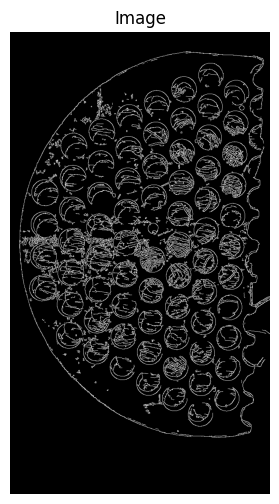

In [69]:
for img_path in bgrem_img_paths[:1]:
    edges = edge_detect_threshold(img_path, threshold=100)
    edges = remove(edges)
    print_image(edges)

In [83]:
# pipeline-1

def img2cut_1(img_path):
    # Load the image of the sheet metal part
    img = cv2.imread(img_path)

    # Convert the image to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Apply Gaussian blur to reduce noise
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)

    # edge detection
    edged = cv2.Canny(blurred, 25, 150)

    # Apply Otsu's thresholding to segment the metal part
    #thresh = cv2.threshold(edged, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]

    # Find contours in the thresholded image
    contours, _ = cv2.findContours(edged, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Find the largest contour
    #largest_contour = max(contours, key=cv2.contourArea)


    # Calculate the bounding rectangle of the largest contour
    '''
    x, y, w, h = cv2.boundingRect(largest_contour)
    '''
    
    # We add some border tolerance
    #btol = 10
    #w += btol
    #h += btol
    
    # Crop the image to just the bounding rectangle
    #cropped = img[y:y+h, x:x+w]

    # Convert the cropped image to grayscale
    #cropped_gray = cv2.cvtColor(cropped, cv2.COLOR_BGR2GRAY)

    # Apply Gaussian blur to reduce noise
    #cropped_blurred = cv2.GaussianBlur(cropped_gray, (5, 5), 0)

    # Apply Canny edge detection
    #cropped_edges = cv2.Canny(cropped_blurred, 50, 150)

    # Find contours in the cropped edge map
    #cropped_contours, _ = cv2.findContours(cropped_edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Draw the contours on a black image
    dxf_img = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.uint8)
    cv2.drawContours(dxf_img, contours, -1, (255, 255, 255), 2)
    
    return dxf_img

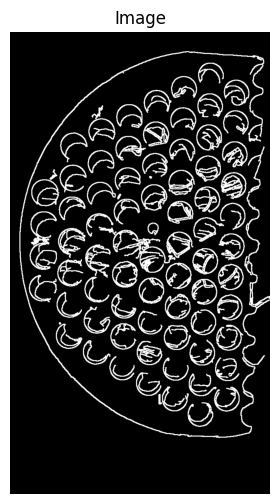

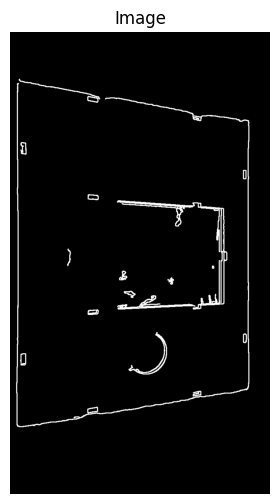

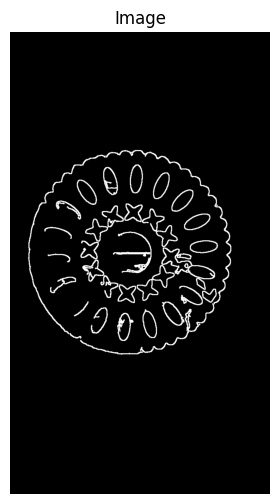

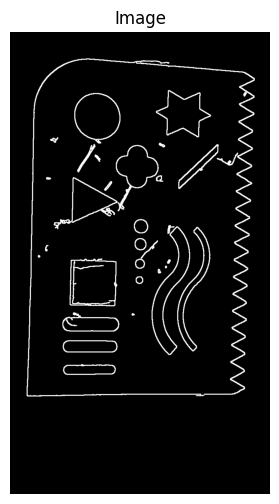

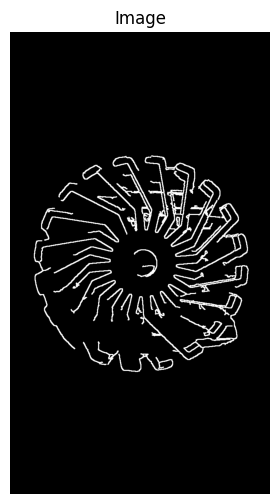

...

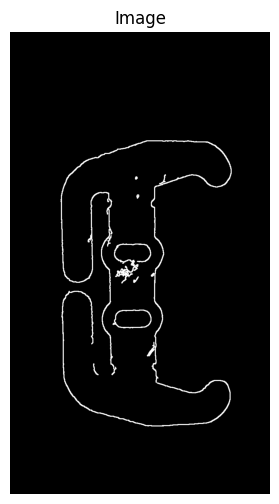

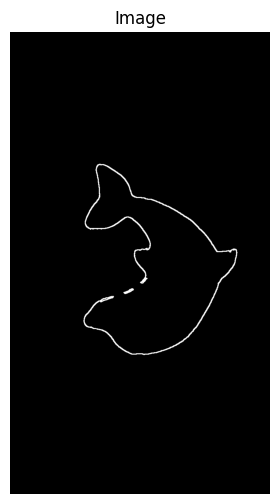

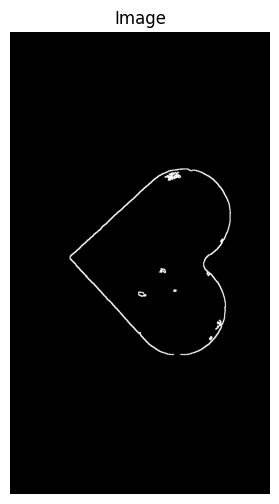

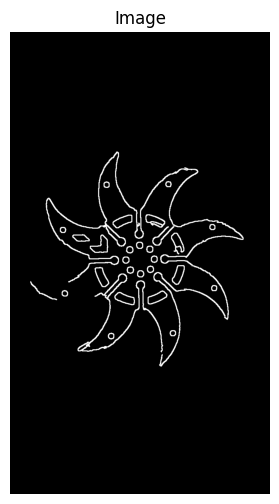

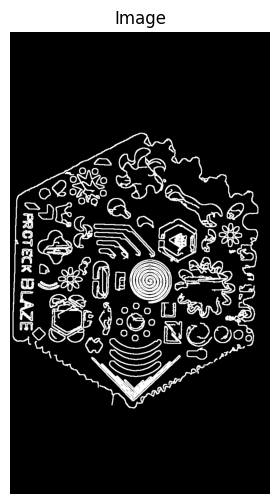

In [84]:
for img_path in bgrem_img_paths:
    edges = img2cut_1(img_path)
    print_image(edges)

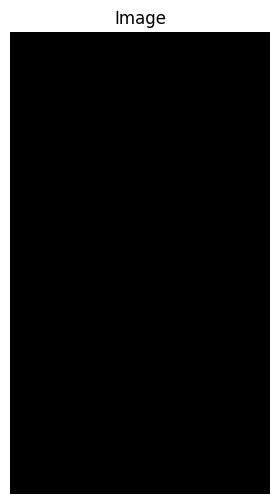

In [51]:
for img_path in bgrem_img_paths[:1]:
    edges = edge_detect_threshold(img_path, threshold=256)
    print_image(edges)

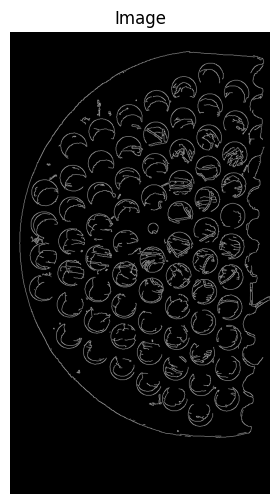

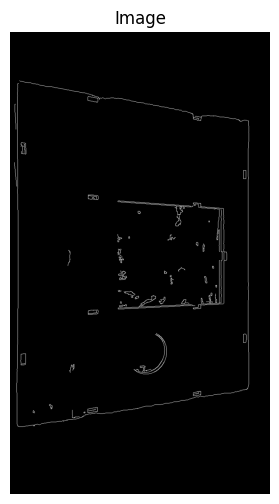

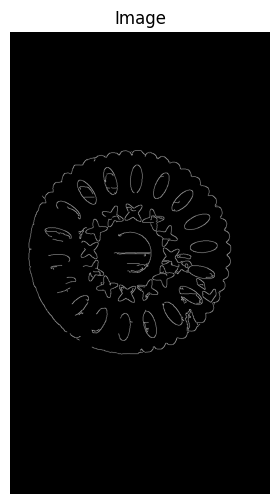

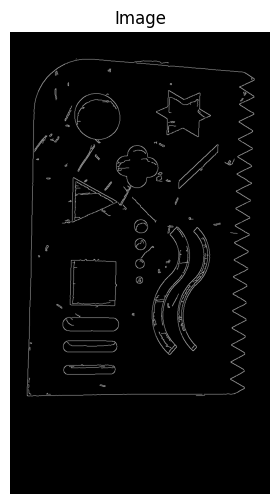

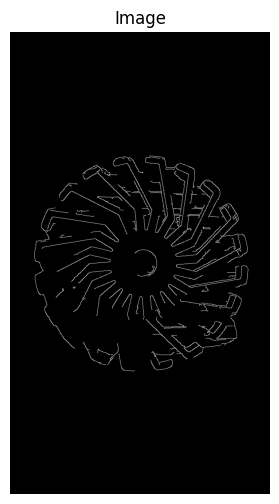

...

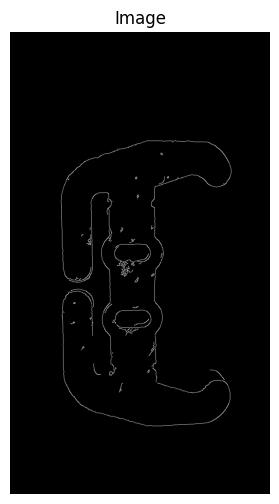

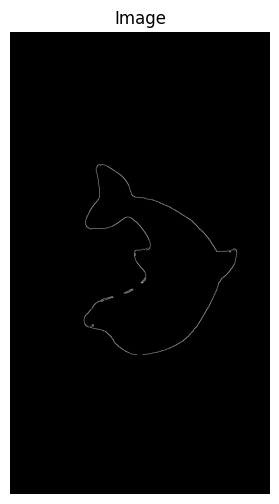

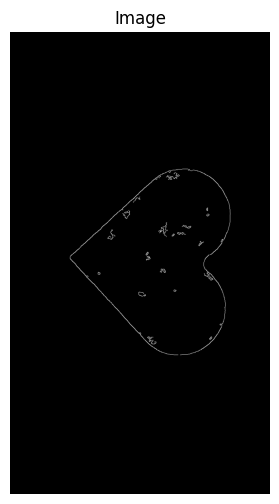

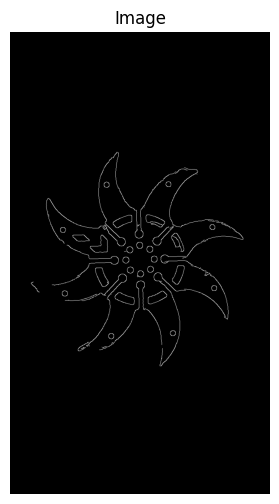

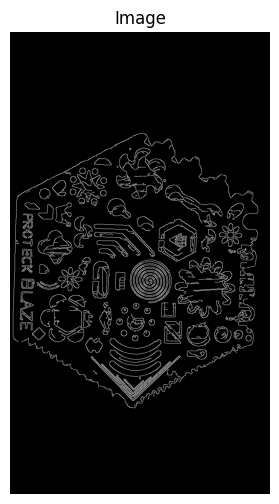

In [66]:
for img_path in bgrem_img_paths:
    edges = edge_detect(img_path)
    print_image(edges)

In [11]:
# laser cut images path
drawing_folder_path = os.path.join('data', 'cad_data', 'laser_parts')
drawing_img_paths = extract_path(drawing_folder_path)
len(drawing_img_paths)

22

In [ ]:
%%time